<a href="https://colab.research.google.com/github/alekseytanana/ml_notebooks/blob/main/Replace_Image_Background.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#@title Install dependencies
from IPython.display import clear_output

!pip install h5py
!pip install typing-extensions
!pip install wheel

%tensorflow_version 1.x

# !pip install ml4a
!pip install git+https://github.com/alekseytanana/ml4a.git@debug
clear_output()

Display original image


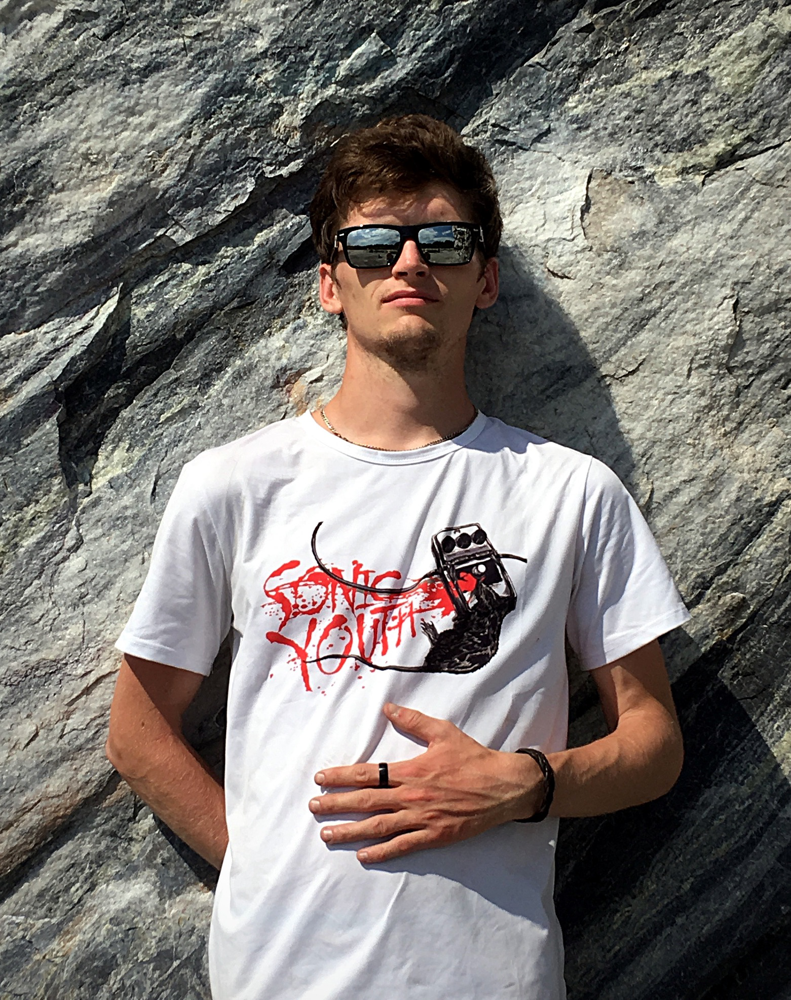

New background


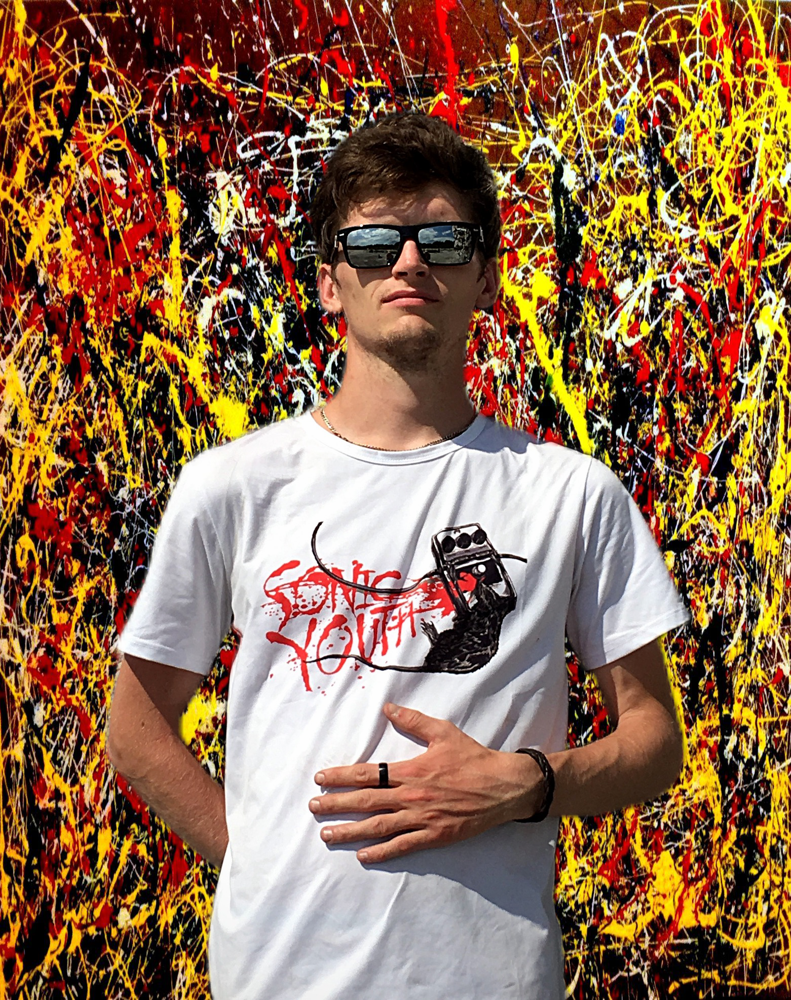

In [4]:
#@title Download. Find face, foreground, masked foreground. Display with new background
from ml4a import image
from ml4a.models import basnet
from ml4a.utils import face
from ml4a import mask

img_link = 'https://www.dropbox.com/s/7bemh1k96e42n7d/ruskeala.jpg?raw=1' #@param {type:"string"}
img = image.load_image(img_link)
image.display(img, title="Original image")

# aligned_img, face_found = face.align_face(img)
# image.display(aligned_img, title="Aligned face")

foreground_mask = basnet.get_foreground(img)
# image.display([img, foreground_mask], title="Img and foreground mask")

img_masked = mask.mask_image(foreground_mask, img)
# image.display(img_masked, title="Masked foreground")

bg_img_link = 'https://i.pinimg.com/originals/95/39/4b/95394b91a920e8c9014bac8eb25056d9.jpg' #@param {type:"string"}
imgbg = image.load_image(bg_img_link, image.get_size(img))
imgbg_masked = mask.mask_image(255-foreground_mask, imgbg)
img_combined = img_masked + imgbg_masked
image.display(img_combined, title="New background")